# What drives the price of a car?

![](images/kurt.jpeg)

**OVERVIEW**

In this application, you will explore a dataset from kaggle that contains information on 3 million used cars.  Your goal is to understand what factors make a car more or less expensive.  As a result of your analysis, you should provide clear recommendations to your client -- a used car dealership -- as to what consumers value in a used car.

### CRISP-DM Framework

<center>
    <img src = images/crisp.png width = 50%/>
</center>


To frame the task, throughout our practical applications we will refer back to a standard process in industry for data projects called CRISP-DM.  This process provides a framework for working through a data problem.  Your first step in this application will be to read through a brief overview of CRISP-DM [here](https://mo-pcco.s3.us-east-1.amazonaws.com/BH-PCMLAI/module_11/readings_starter.zip).  After reading the overview, answer the questions below.

### Business Understanding

From a business perspective, we are tasked with identifying key drivers for used car prices.  In the CRISP-DM overview, we are asked to convert this business framing to a data problem definition.  Using a few sentences, reframe the task as a data task with the appropriate technical vocabulary. 

The management of this car dealership wants to have an insight into the features responsible  for increase or decrease 
in used cars. The dataset obtained from kaggle will be used to build a regression model that will be applied in the prediction 
of the prices of the used cars. The final best model with all the important features will be provided and this will be used to 
predict the price for new set of features. 

Just before the model is built, the data will be explored first and then prepared for modelling. It is expected that at the end 
of this project, recommendations will be provided to this car dealer such that more focus will be placed on the recommended 
features that are key drivers of the increase or decrease in used car prices. 

### Data Understanding

After considering the business understanding, we want to get familiar with our data.  Write down some steps that you would take to get to know the dataset and identify any quality issues within.  Take time to get to know the dataset and explore what information it contains and how this could be used to inform your business understanding.

In [350]:
import pandas as pd
import numpy as np
import sys
import re
from datetime import datetime
import matplotlib.pyplot as plt
import plotly.express as px
%matplotlib inline
from matplotlib import style
import seaborn as sns
import math as math
from pylab import rcParams
from scipy import stats
from sklearn.impute import SimpleImputer
from scipy.stats import zscore 
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn import decomposition, datasets
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.cluster import KMeans
from sklearn.ensemble import RandomForestClassifier
from sklearn import svm
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report,confusion_matrix
from sklearn.metrics import accuracy_score, roc_auc_score, roc_curve
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.multioutput import MultiOutputClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.preprocessing import PolynomialFeatures
from sklearn.feature_selection import VarianceThreshold 
from sklearn.metrics import mean_squared_error, r2_score 
from sklearn.model_selection import KFold, train_test_split, cross_val_score

In [388]:
vehicles = pd.read_csv('C:/Users/oyeye/Downloads/practical_application_II_starter/data/vehicles.csv')

In [389]:
vehicles.drop(['id', 'region', 'year', 'manufacturer', 'model', 'VIN'], axis = 1, inplace = True)

In [390]:
vehicles.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 426880 entries, 0 to 426879
Data columns (total 12 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   price         426880 non-null  int64  
 1   condition     252776 non-null  object 
 2   cylinders     249202 non-null  object 
 3   fuel          423867 non-null  object 
 4   odometer      422480 non-null  float64
 5   title_status  418638 non-null  object 
 6   transmission  424324 non-null  object 
 7   drive         296313 non-null  object 
 8   size          120519 non-null  object 
 9   type          334022 non-null  object 
 10  paint_color   296677 non-null  object 
 11  state         426880 non-null  object 
dtypes: float64(1), int64(1), object(10)
memory usage: 39.1+ MB


In [391]:
df = vehicles[(vehicles['price'] >= 500) & (vehicles['price'] <= 500000)]

#### Data Exploration

[Text(0.5, 1.0, 'Used Car Prices')]

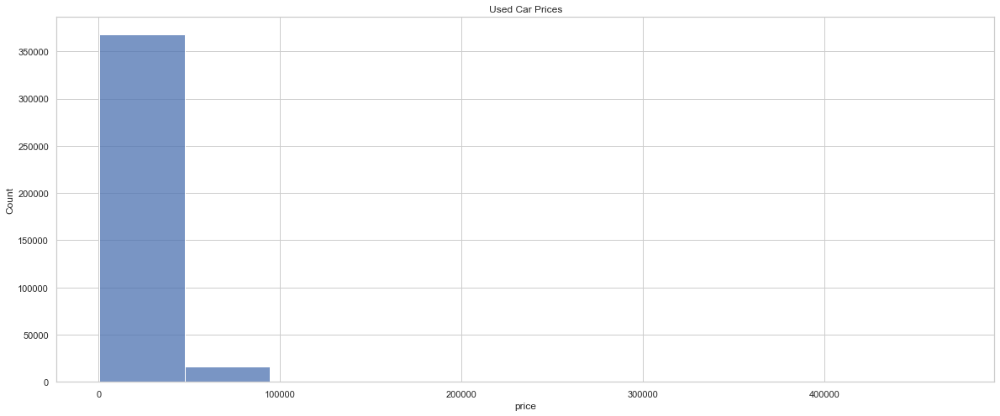

In [392]:
sns.histplot(df, x = 'price', bins = 10).set(title = 'Used Car Prices')

In [393]:
px.box(df, y = 'price')

<AxesSubplot:xlabel='condition', ylabel='count'>

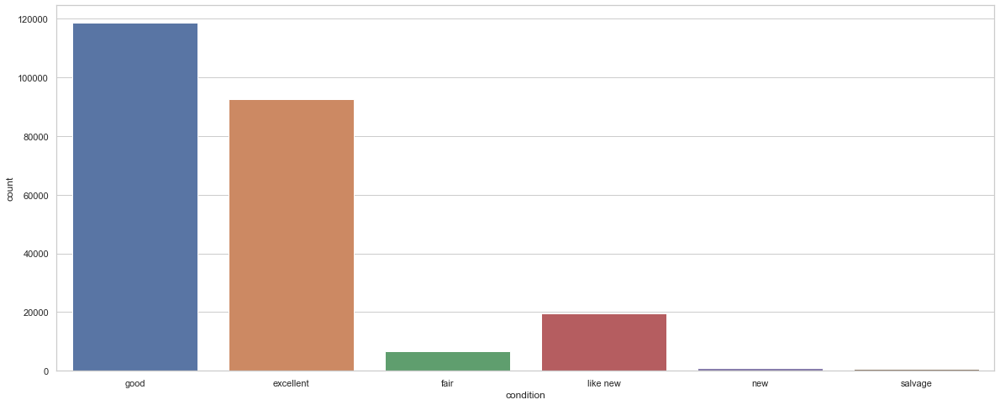

In [394]:
sns.set_style('whitegrid')
sns.countplot(x = 'condition', data = df)

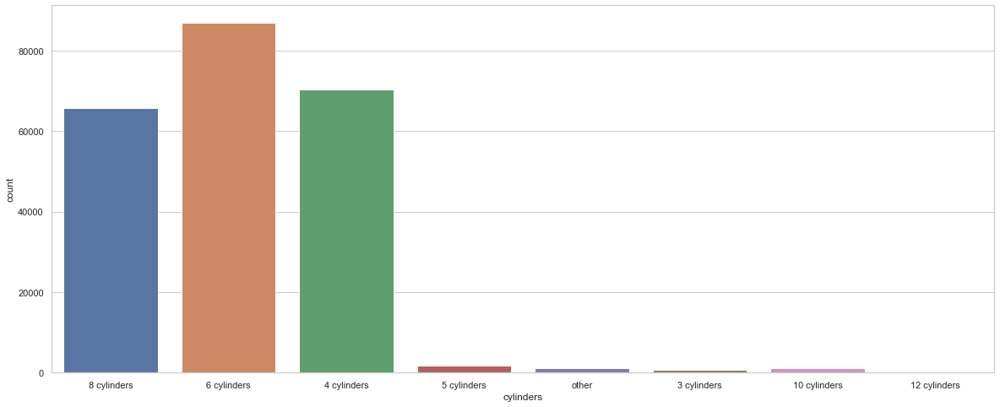

In [395]:
sns.set_style('whitegrid')
sns.countplot(x = 'cylinders', data = df)
sns.set(rc = {'figure.figsize':(20, 8)})

<AxesSubplot:xlabel='fuel', ylabel='count'>

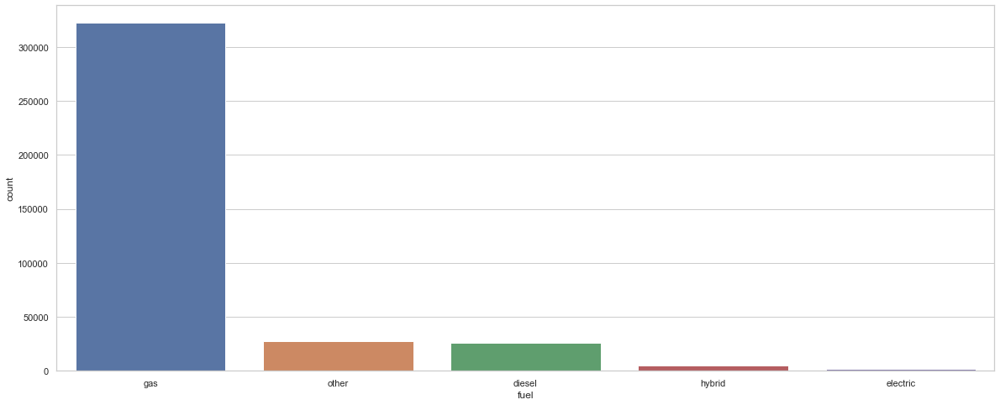

In [396]:
sns.set_style('whitegrid')
sns.countplot(x = 'fuel', data = df)

<AxesSubplot:xlabel='title_status', ylabel='count'>

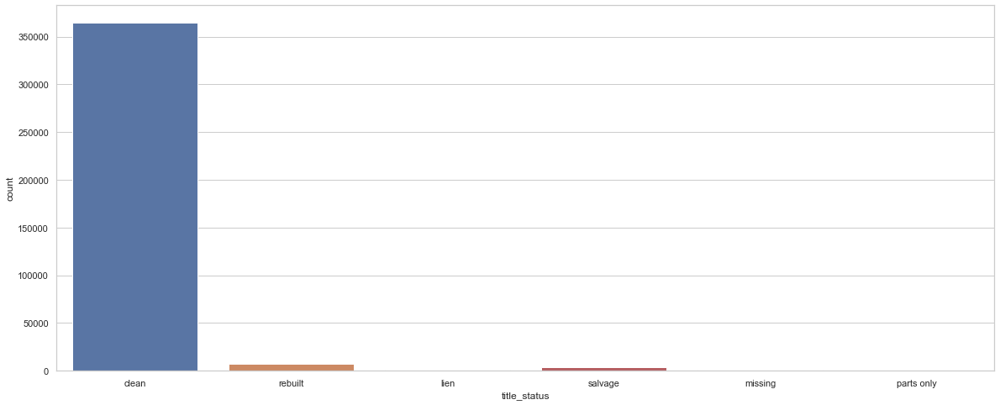

In [397]:
sns.set_style('whitegrid')
sns.countplot(x = 'title_status', data = df)

<AxesSubplot:xlabel='transmission', ylabel='count'>

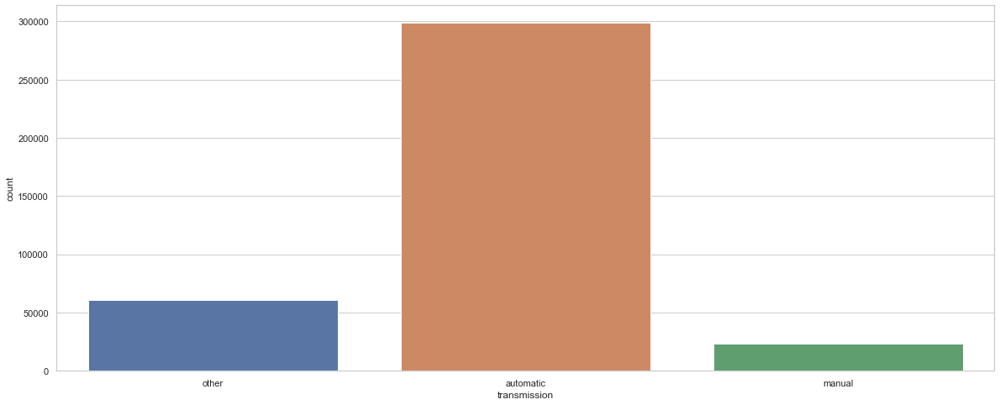

In [398]:
sns.set_style('whitegrid')
sns.countplot(x = 'transmission', data = df)

<AxesSubplot:xlabel='drive', ylabel='count'>

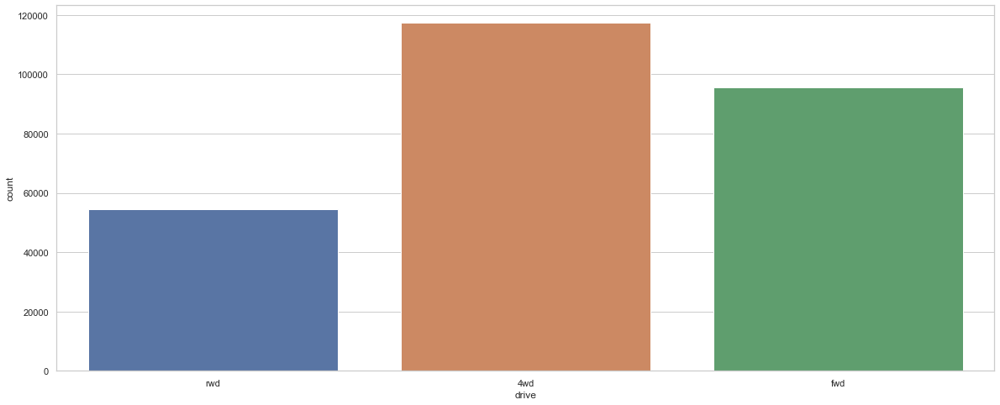

In [399]:
sns.set_style('whitegrid')
sns.countplot(x = 'drive', data = df)

<AxesSubplot:xlabel='size', ylabel='count'>

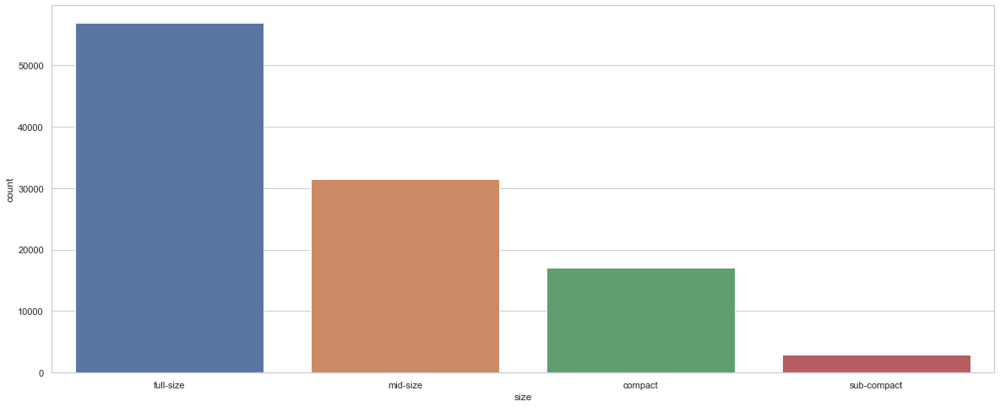

In [400]:
sns.set_style('whitegrid')
sns.countplot(x = 'size', data = df)

<AxesSubplot:xlabel='type', ylabel='count'>

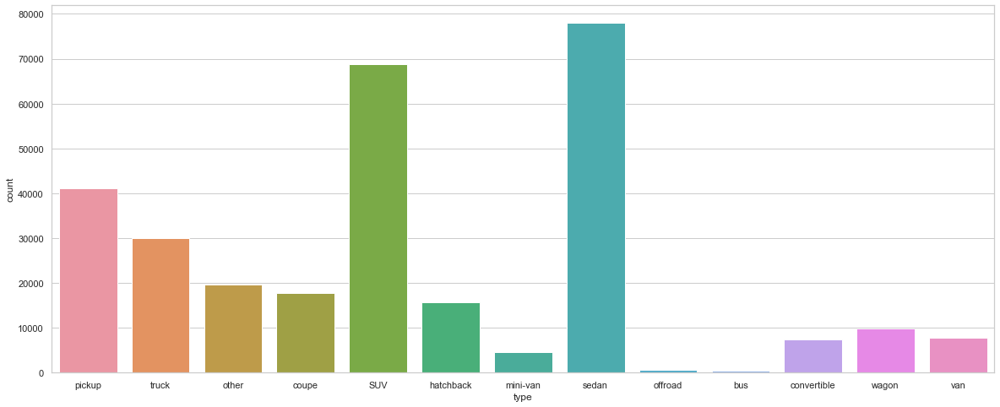

In [401]:
sns.set_style('whitegrid')
sns.countplot(x = 'type', data = df)

<AxesSubplot:xlabel='paint_color', ylabel='count'>

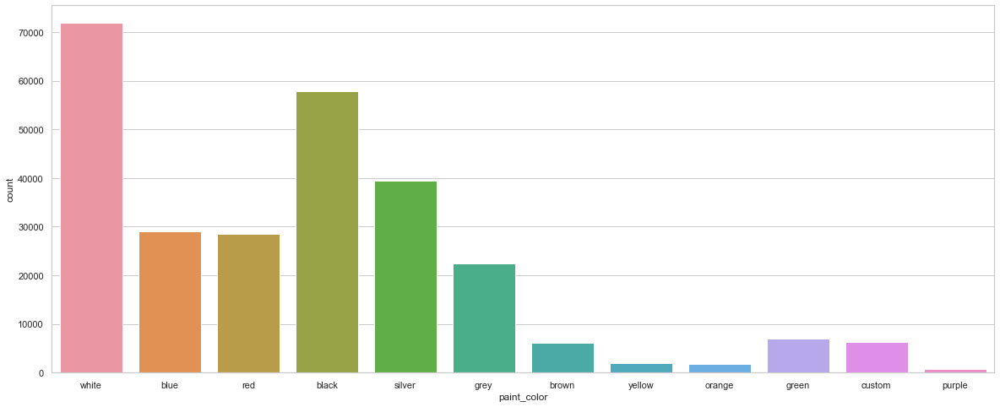

In [402]:
sns.set_style('whitegrid')
sns.countplot(x = 'paint_color', data = df)

In [403]:
Q1 = df['price'].quantile(0.25)
Q3 = df['price'].quantile(0.75)
IQR = Q3 - Q1
upper = Q3 + 1.5 * IQR
lower = Q1 - 1.5 * IQR
new_df = df[(df['price'] > lower) & (df['price'] < upper)]

In [404]:
px.box(new_df, y = 'price')

[Text(0.5, 1.0, 'Histogram of Used Car Prices')]

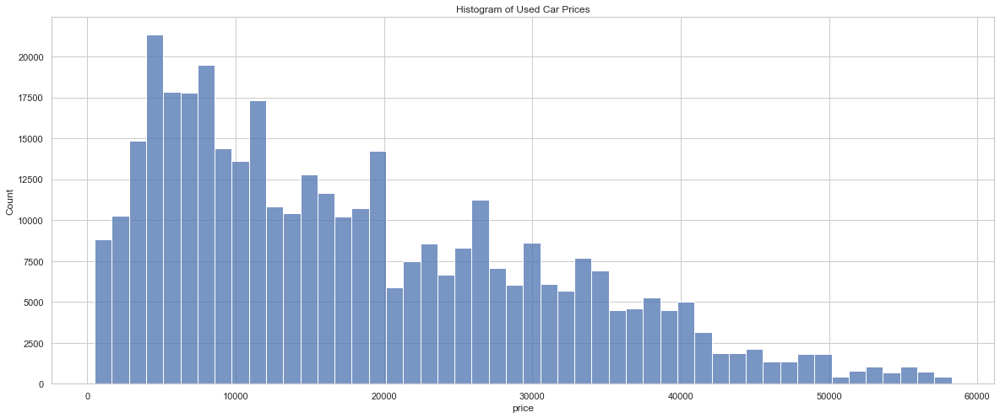

In [405]:
sns.histplot(new_df, x = 'price', bins = 50).set(title = 'Histogram of Used Car Prices')

### Data Preparation

After our initial exploration and fine tuning of the business understanding, it is time to construct our final dataset prior to modeling.  Here, we want to make sure to handle any integrity issues and cleaning, the engineering of new features, any transformations that we believe should happen (scaling, logarithms, normalization, etc.), and general preparation for modeling with `sklearn`. 

In [406]:
imputer = SimpleImputer(missing_values = np.NaN, strategy = 'most_frequent')
new_df['size'] = imputer.fit_transform(new_df['size'].values.reshape(-1,1))[:, 0]
new_df['condition'] = imputer.fit_transform(new_df['condition'].values.reshape(-1,1))[:, 0]
new_df['cylinders'] = imputer.fit_transform(new_df['cylinders'].values.reshape(-1,1))[:, 0]
new_df['fuel'] = imputer.fit_transform(new_df['fuel'].values.reshape(-1,1))[:, 0]
new_df['title_status'] = imputer.fit_transform(new_df['title_status'].values.reshape(-1,1))[:, 0]
new_df['transmission'] = imputer.fit_transform(new_df['transmission'].values.reshape(-1,1))[:, 0]
new_df['drive'] = imputer.fit_transform(new_df['drive'].values.reshape(-1,1))[:, 0]
new_df['type'] = imputer.fit_transform(new_df['type'].values.reshape(-1,1))[:, 0]
new_df['paint_color'] = imputer.fit_transform(new_df['paint_color'].values.reshape(-1,1))[:, 0]

<ipython-input-406-6a9fceb0dfce>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-406-6a9fceb0dfce>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-406-6a9fceb0dfce>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-406-6a9

In [407]:
new_df.dropna(inplace = True)

<ipython-input-407-6b34463e2f37>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [408]:
df1 = new_df[new_df['cylinders'] != 'other']
df1.shape

(373976, 12)

In [409]:
df1['cylinders'] = df1['cylinders'].str.extract('(\d+)').astype(int)

<ipython-input-409-57c5f114b9e9>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [410]:
import category_encoders as ce
tenc = ce.TargetEncoder() 
ndf = tenc.fit_transform(df1['state'], df1['price'])

df_new = ndf.join(df1.drop('state',axis = 1))
df_new

C:\Users\oyeye\anaconda3\lib\site-packages\category_encoders\target_encoder.py:92: FutureWarning:

Default parameter min_samples_leaf will change in version 2.6.See https://github.com/scikit-learn-contrib/category_encoders/issues/327

C:\Users\oyeye\anaconda3\lib\site-packages\category_encoders\target_encoder.py:97: FutureWarning:

Default parameter smoothing will change in version 2.6.See https://github.com/scikit-learn-contrib/category_encoders/issues/327



,state,price,condition,cylinders,fuel,odometer,title_status,transmission,drive,size,type,paint_color
27,20835.576360,33590,good,8,gas,57923.0,clean,other,4wd,full-size,pickup,white
28,20835.576360,22590,good,8,gas,71229.0,clean,other,4wd,full-size,pickup,blue
29,20835.576360,39590,good,8,gas,19160.0,clean,other,4wd,full-size,pickup,red
30,20835.576360,30990,good,8,gas,41124.0,clean,other,4wd,full-size,pickup,red
31,20835.576360,15000,excellent,6,gas,128000.0,clean,automatic,rwd,full-size,truck,black
...,...,...,...,...,...,...,...,...,...,...,...,...
426875,21388.487455,23590,good,6,gas,32226.0,clean,other,fwd,full-size,sedan,white
426876,21388.487455,30590,good,6,gas,12029.0,clean,other,fwd,full-size,sedan,red
426877,21388.487455,34990,good,6,diesel,4174.0,clean,other,4wd,full-size,hatchback,white
426878,21388.487455,28990,good,6,gas,30112.0,clean,other,fwd,full-size,sedan,silver


In [411]:
dff = pd.get_dummies(df_new, drop_first = True)
dff.head()

,state,price,cylinders,odometer,condition_fair,condition_good,condition_like new,condition_new,condition_salvage,fuel_electric,...,paint_color_brown,paint_color_custom,paint_color_green,paint_color_grey,paint_color_orange,paint_color_purple,paint_color_red,paint_color_silver,paint_color_white,paint_color_yellow
27,20835.57636,33590,8,57923.0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
28,20835.57636,22590,8,71229.0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
29,20835.57636,39590,8,19160.0,0,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
30,20835.57636,30990,8,41124.0,0,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
31,20835.57636,15000,6,128000.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [412]:
dff.corr()

,state,price,cylinders,odometer,condition_fair,condition_good,condition_like new,condition_new,condition_salvage,fuel_electric,...,paint_color_brown,paint_color_custom,paint_color_green,paint_color_grey,paint_color_orange,paint_color_purple,paint_color_red,paint_color_silver,paint_color_white,paint_color_yellow
state,1.000000,0.151725,0.033692,-0.016612,-0.007677,0.061882,-0.004350,0.006463,0.000830,0.001601,...,0.001825,0.016876,-0.013509,-0.006250,-0.005522,-0.000155,-0.006715,-0.002871,0.030823,0.000579
price,0.151725,1.000000,0.255936,-0.197401,-0.149892,0.183088,-0.007586,0.016109,-0.042787,0.031973,...,-0.023654,-0.026245,-0.057641,-0.063598,0.002529,-0.013400,0.010778,-0.044331,0.040022,-0.003823
cylinders,0.033692,0.255936,1.000000,0.018911,0.023108,0.071825,-0.032958,-0.003537,-0.005427,-0.004449,...,0.006015,-0.010906,-0.000625,-0.088565,-0.005454,-0.000718,0.012204,-0.062933,0.079395,0.022841
odometer,-0.016612,-0.197401,0.018911,1.000000,0.084372,-0.042254,-0.016776,-0.010922,0.023623,-0.019644,...,0.006093,0.009931,0.020835,0.009827,-0.007144,0.003195,-0.012442,-0.002846,0.015947,0.000795
condition_fair,-0.007677,-0.149892,0.023108,0.084372,1.000000,-0.198282,-0.030830,-0.006440,-0.005061,-0.006704,...,0.020457,0.002898,0.041395,0.008819,0.001690,0.012742,0.012305,-0.002787,-0.033873,0.012132
condition_good,0.061882,0.183088,0.071825,-0.042254,-0.198282,1.000000,-0.342487,-0.071543,-0.056228,0.024518,...,-0.018899,0.013880,-0.019006,-0.107530,-0.005441,-0.008360,-0.007828,-0.015715,0.072196,-0.014759
condition_like new,-0.004350,-0.007586,-0.032958,-0.016776,-0.030830,-0.342487,1.000000,-0.011124,-0.008743,-0.004377,...,0.007513,-0.003462,-0.002781,0.042761,0.003330,0.004656,0.003364,0.004692,-0.029794,0.012305
condition_new,0.006463,0.016109,-0.003537,-0.010922,-0.006440,-0.071543,-0.011124,1.000000,-0.001826,0.000792,...,0.001742,0.001754,0.003801,0.011881,0.004732,-0.000645,0.003506,-0.000595,-0.008001,0.009647
condition_salvage,0.000830,-0.042787,-0.005427,0.023623,-0.005061,-0.056228,-0.008743,-0.001826,1.000000,-0.002285,...,0.002417,0.000746,0.003275,0.004691,0.003532,0.003572,0.001119,-0.000649,-0.007448,0.001188
fuel_electric,0.001601,0.031973,-0.004449,-0.019644,-0.006704,0.024518,-0.004377,0.000792,-0.002285,1.000000,...,-0.005979,-0.005265,-0.007898,-0.006338,-0.000303,-0.002494,-0.010652,-0.000754,0.018872,-0.003128


<AxesSubplot:>

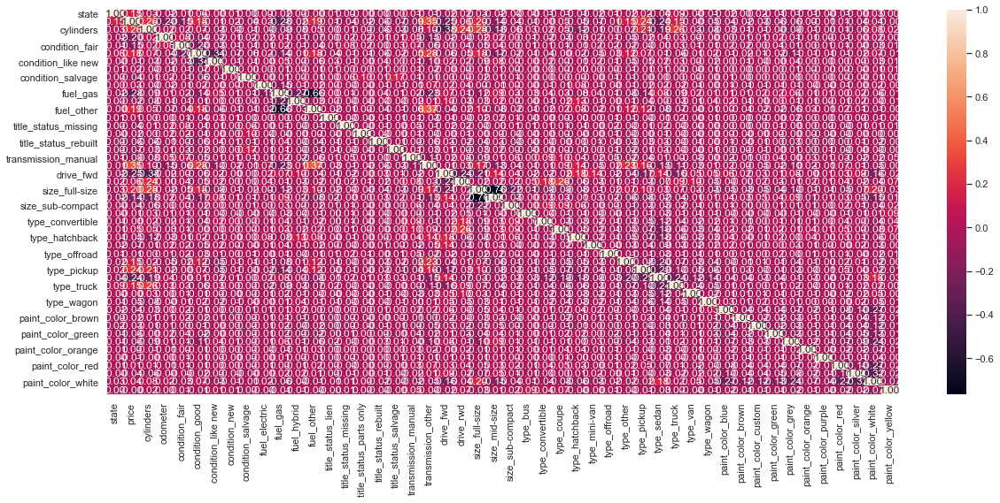

In [413]:
sns.heatmap(dff.corr(), annot = True, fmt = '.2f')

### Multicollinearity check using VIF

In [414]:
features = dff.drop('price', axis = 1)
vif = pd.DataFrame()
vif["VIF"] = [variance_inflation_factor(features.values, i) for i in range(features.shape[1])]
vif["Features"] = features.columns
vif

,VIF,Features
0,44.681953,state
1,30.573021,cylinders
2,1.316499,odometer
3,1.096470,condition_fair
4,4.328401,condition_good
5,1.213263,condition_like new
6,1.010792,condition_new
7,1.052782,condition_salvage
8,1.081214,fuel_electric
9,14.618429,fuel_gas


In [415]:
features = dff.drop(['price', 'state', 'cylinders', 'size_full-size', 'fuel_gas'], axis = 1)
vif = pd.DataFrame()
vif["VIF"] = [variance_inflation_factor(features.values, i) for i in range(features.shape[1])]
vif["Features"] = features.columns
vif

,VIF,Features
0,1.291096,odometer
1,1.083472,condition_fair
2,3.511843,condition_good
3,1.161954,condition_like new
4,1.008162,condition_new
5,1.051768,condition_salvage
6,1.021486,fuel_electric
7,1.042525,fuel_hybrid
8,1.277720,fuel_other
9,1.006548,title_status_lien


In [416]:
data = dff.drop(['state', 'cylinders', 'size_full-size', 'fuel_gas'], axis=1)

### Feature Importance

In [417]:
# Important feature using ExtraTreesRegressor
from sklearn.ensemble import ExtraTreesRegressor
X = data.drop('price', axis = 1)
y = data['price']
model = ExtraTreesRegressor()
model.fit(X, y)

ExtraTreesRegressor()

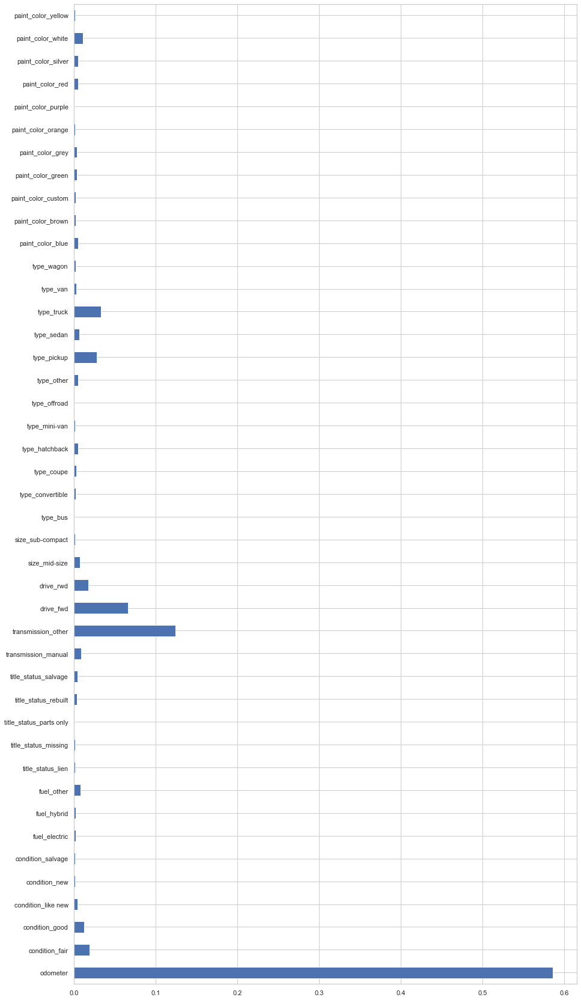

In [418]:
# plot graph of feature importances for better visualization
plt.figure(figsize=[15, 30])
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.plot(kind='barh')
plt.show()

In [419]:
print(feat_importances.sort_values(ascending=False))

odometer                   0.586214
transmission_other         0.124234
drive_fwd                  0.065755
type_truck                 0.032729
type_pickup                0.027971
condition_fair             0.018582
drive_rwd                  0.017678
condition_good             0.012556
paint_color_white          0.010819
transmission_manual        0.008291
fuel_other                 0.007545
size_mid-size              0.007040
type_sedan                 0.006530
type_other                 0.005252
paint_color_red            0.005091
paint_color_blue           0.004716
type_hatchback             0.004642
paint_color_silver         0.004616
condition_like new         0.004387
title_status_salvage       0.003935
paint_color_grey           0.003501
title_status_rebuilt       0.003452
paint_color_green          0.003290
type_coupe                 0.003045
type_van                   0.002427
paint_color_brown          0.002274
paint_color_custom         0.002228
type_convertible           0

In [420]:
final_df = data[['price', 'odometer', 'transmission_other', 'drive_fwd', 'type_truck', 'type_pickup', 'condition_fair', 
                'drive_rwd', 'condition_good']]

In [421]:
final_df

,price,odometer,transmission_other,drive_fwd,type_truck,type_pickup,condition_fair,drive_rwd,condition_good
27,33590,57923.0,1,0,0,1,0,0,1
28,22590,71229.0,1,0,0,1,0,0,1
29,39590,19160.0,1,0,0,1,0,0,1
30,30990,41124.0,1,0,0,1,0,0,1
31,15000,128000.0,0,0,1,0,0,1,0
...,...,...,...,...,...,...,...,...,...
426875,23590,32226.0,1,1,0,0,0,0,1
426876,30590,12029.0,1,1,0,0,0,0,1
426877,34990,4174.0,1,0,0,0,0,0,1
426878,28990,30112.0,1,1,0,0,0,0,1


In [422]:
from sklearn.feature_selection import f_regression,SelectKBest

X = data.drop('price', axis = 1)
y = data['price']

f_regression(X, y)

p_values = f_regression(X, y)[1]

p_values.round(3)

array([0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   ,
       0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   ,
       0.   , 0.   , 0.   , 0.272, 0.   , 0.   , 0.   , 0.   , 0.   ,
       0.   , 0.   , 0.   , 0.107, 0.   , 0.   , 0.   , 0.   , 0.   ,
       0.   , 0.122, 0.   , 0.   , 0.   , 0.   , 0.019])

In [423]:
p_values > 0.05

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False,  True, False, False, False, False, False,
       False, False, False,  True, False, False, False, False, False,
       False,  True, False, False, False, False, False])

#### Model Development

In [424]:
X = final_df.drop('price', axis=1)
y = final_df['price']

In [425]:
X.head()

,odometer,transmission_other,drive_fwd,type_truck,type_pickup,condition_fair,drive_rwd,condition_good
27,57923.0,1,0,0,1,0,0,1
28,71229.0,1,0,0,1,0,0,1
29,19160.0,1,0,0,1,0,0,1
30,41124.0,1,0,0,1,0,0,1
31,128000.0,0,0,1,0,0,1,0


### Feature Scaling

In [426]:
X['odometer'] = (X['odometer'] - X['odometer'].mean()) / X['odometer'].std()

In [427]:
X.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 373976 entries, 27 to 426879
Data columns (total 8 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   odometer            373976 non-null  float64
 1   transmission_other  373976 non-null  uint8  
 2   drive_fwd           373976 non-null  uint8  
 3   type_truck          373976 non-null  uint8  
 4   type_pickup         373976 non-null  uint8  
 5   condition_fair      373976 non-null  uint8  
 6   drive_rwd           373976 non-null  uint8  
 7   condition_good      373976 non-null  uint8  
dtypes: float64(1), uint8(7)
memory usage: 16.3 MB


#### Training and Testing

In [428]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=365)

#### Linear Regression Model

In [429]:
# Model Building
from sklearn.linear_model import LinearRegression
lr = LinearRegression()

# Training Model
lr.fit(X_train, y_train)

# Model Summary
y_pred_lr = lr.predict(X_test)

r_squared = r2_score(y_test, y_pred_lr)
rmse = np.sqrt(mean_squared_error(y_test, y_pred_lr))
print("R_squared :", r_squared)
print("RMSE :", rmse)

R_squared : 0.2751887873483715
RMSE : 10773.605454573099


#### Random Forest Regressor Model

In [430]:
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor()

# Training Model
rf.fit(X_train, y_train)

# Model Summary
y_pred_rf = rf.predict(X_test)

r_squared = r2_score(y_test, y_pred_rf)
rmse = np.sqrt(mean_squared_error(y_test, y_pred_rf))
print("R_squared :",r_squared)
print("RMSE :", rmse)

R_squared : 0.6989090627589323
RMSE : 6943.804056173841


#### GBT Regressor Model

In [431]:
from sklearn.ensemble import GradientBoostingRegressor
gbt = GradientBoostingRegressor()

# Training Model
gbt.fit(X_train, y_train)

# Model Summary
y_pred_gbt = gbt.predict(X_test)

r_squared = r2_score(y_test, y_pred_gbt)
rmse = np.sqrt(mean_squared_error(y_test, y_pred_gbt))
print("R_squared :",r_squared)
print("RMSE :", rmse)

R_squared : 0.5227664472625888
RMSE : 8742.066390684557


In [334]:
#Randomized Search CV
from sklearn.model_selection import RandomizedSearchCV
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 1200, num = 12)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(5, 30, num = 6)]
# max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10, 15, 100]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 5, 10]

# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf}

print(random_grid)

{'n_estimators': [100, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 1100, 1200], 'max_features': ['auto', 'sqrt'], 'max_depth': [5, 10, 15, 20, 25, 30], 'min_samples_split': [2, 5, 10, 15, 100], 'min_samples_leaf': [1, 2, 5, 10]}


In [335]:
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 10, cv = 5, verbose=2, random_state=42, n_jobs = 1)

In [337]:
rf_random.fit(X_train, y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=900; total time= 1.3min
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=900; total time= 1.3min
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=900; total time= 1.3min
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=900; total time= 1.6min
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=900; total time= 1.5min
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=1100; total time= 2.9min
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=1100; total time= 3.0min
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimator

RandomizedSearchCV(cv=5, estimator=RandomForestRegressor(), n_jobs=1,
                   param_distributions={'max_depth': [5, 10, 15, 20, 25, 30],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 5, 10],
                                        'min_samples_split': [2, 5, 10, 15,
                                                              100],
                                        'n_estimators': [100, 200, 300, 400,
                                                         500, 600, 700, 800,
                                                         900, 1000, 1100,
                                                         1200]},
                   random_state=42, verbose=2)

In [338]:
rf_random.best_params_

{'n_estimators': 1000,
 'min_samples_split': 2,
 'min_samples_leaf': 1,
 'max_features': 'sqrt',
 'max_depth': 25}

In [339]:
predictions=rf_random.predict(X_test)

In [340]:
r_squared = r2_score(y_test,predictions)
rmse = np.sqrt(mean_squared_error(y_test,predictions))
print("R_squared :",r_squared)

R_squared : 0.6955263271471148


### Evaluation

With some modeling accomplished, we aim to reflect on what we identify as a high quality model and what we are able to learn from this.  We should review our business objective and explore how well we can provide meaningful insight on drivers of used car prices.  Your goal now is to distill your findings and determine whether the earlier phases need revisitation and adjustment or if you have information of value to bring back to your client.

Explanation
The following features are responsible for the price direction of used cars. These include odometer, transmission, dive, vehicle type, and condition. Linear regression, random forest and GBT regressor models were all used but the best out of all turned out to be the random forest model with the highest R squared and lowest RMSE.

### Deployment

Now that we've settled on our models and findings, it is time to deliver the information to the client.  You should organize your work as a basic report that details your primary findings.  Keep in mind that your audience is a group of used car dealers interested in fine tuning their inventory.